# Differentiating Precipitation and Blowing Snow During Winter 2023 Using SAIL Ceilometer Data

Author: Daniel Hogan
Created: June 13, 2024

This notebook will look at conditions in the lower atmosphere during different days over the 2023 campaign to distinguish when snow was falling vs. when it was blowing vs. when it was falling and blowing.
I'll seek to do this by trying to do this by using ceilometer data from SAIL, blowing snow data from SOS, wind speed data from SAIL, and laser disdrometer data during 3 types of conditions:
1) A clear day with blowing snow.
2) A snowy day with no blowing snow.
3) A mixed day with both blowing snow and falling snow.

### Imports


In [1]:
# general
import os
import glob
import datetime as dt
import json
# data 
import xarray as xr 
from sublimpy import utils, variables, tidy, turbulence
import numpy as np
import pandas as pd
from act import discovery, plotting
# plotting
import matplotlib.pyplot as plt
from metpy.cbook import get_test_data
from metpy.plots import add_metpy_logo, SkewT
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import cufflinks as cf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
# helper tools
from scripts.get_sail_data import get_sail_data
from scripts.helper_funcs import create_windrose_df, simple_sounding, mean_sounding
import scripts.helper_funcs as hf
from metpy import calc, units
# make plotly work 
init_notebook_mode(connected=True)
cf.go_offline()

nctoolkit is using Climate Data Operators version 2.3.0


# Gather Necessary Datasets

In [2]:
# laser disdrometer data
w23_ld_gts_ds = xr.open_dataset('/storage/dlhogan/synoptic_sublimation/sail_data/winter_22_23/laser_disdrometer_gothic_20221001_20230930.nc')
w23_prcp_rate_gts_ds = w23_ld_gts_ds.sel(time=slice('2022-12-01', '2023-03-31'))[['precip_rate', 'qc_precip_rate']].to_dataframe().resample('5min').mean().to_xarray()

# winter 2022 laser disdrometer data
w22_ld_gts_ds = xr.open_dataset('/storage/dlhogan/synoptic_sublimation/sail_data/winter_21_22/laser_disdrometer_gothic_20211001_20220930.nc')
w22_prcp_rate_gts_ds = w22_ld_gts_ds.sel(time=slice('2021-12-01', '2022-03-31'))[['precip_rate', 'qc_precip_rate']].to_dataframe().resample('5min').mean().to_xarray()

# blowing snow data
sos_ds_5min = xr.open_dataset('../../01_data/processed_data/sos_ds_5min_storage.nc')
sos_ds_5min = sos_ds_5min.sel(time=slice('2022-12-01', '2023-03-31')).to_dataframe().resample('5min').mean().to_xarray()

# wind data
w23_sail_met = xr.open_dataset('/storage/dlhogan/synoptic_sublimation/sail_data/winter_22_23/met_20221001_20230930.nc')
w23_sail_met = w23_sail_met.sel(time=slice('2022-12-01', '2023-03-31')).drop_dims('bound').to_dataframe().resample('5min').mean().to_xarray()

In [3]:
# get the three variables I need
sos_blowing_snow = (sos_ds_5min['SF_avg_1m_ue'] + sos_ds_5min['SF_avg_2m_ue']).to_pandas()
sos_blowing_snow.name = 'blowing_snow'
sail_10m_wind = w23_sail_met['wspd_vec_mean'].to_pandas()
sail_10m_wind.name = 'wspd'
sail_ld_prcp = w23_prcp_rate_gts_ds['precip_rate'].to_pandas()
sail_ld_prcp.name = 'precip_rate'

df = pd.concat([sos_blowing_snow, sail_10m_wind, sail_ld_prcp], axis=1)


In [4]:
# make a 3- panel plot in plotly
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, subplot_titles=('Blowing Snow', '10m Wind Speed', 'Laser Disdrometer Precipitation Rate'), vertical_spacing=0.05)

# blowing snow
fig.add_trace(go.Scatter(x=df.index, y=np.log10(df['blowing_snow']), mode='lines', name='blowing snow'), row=1, col=1)
# wind speed
fig.add_trace(go.Scatter(x=df.index, y=df['wspd'], mode='lines', name='10m wind speed'), row=2, col=1)
# precipitation rate
fig.add_trace(go.Scatter(x=df.index, y=df['precip_rate'], mode='lines', name='precipitation rate'), row=3, col=1)

fig.update_layout(width=1000, height=700)
# decrease the spacing between the subplots
fig.update_layout(margin=dict(l=20, r=20, t=20, b=20), showlegend=False)

divide by zero encountered in log10


In [5]:
# filter to days with no blowing snow, but with precipitation
# filter to days with no blowing snow, but with precipitation
days_with_no_bs = df.resample('1D').sum()[df.resample('1D').sum()['blowing_snow'] == 0].index
df_nbs = df.copy()
df_nbs['date'] = pd.to_datetime(df_nbs.index.date)
df_nbs = df_nbs[df_nbs['date'].isin(days_with_no_bs)]
# make a 3- panel plot in plotly
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, subplot_titles=('Blowing Snow', '10m Wind Speed', 'Laser Disdrometer Precipitation Rate'), vertical_spacing=0.05)

# blowing snow
fig.add_trace(go.Scatter(x=df_nbs.index, y=np.log10(df_nbs['blowing_snow']), mode='lines', name='blowing snow'), row=1, col=1)
# wind speed
fig.add_trace(go.Scatter(x=df_nbs.index, y=df_nbs['wspd'], mode='lines', name='10m wind speed'), row=2, col=1)
# precipitation rate
fig.add_trace(go.Scatter(x=df_nbs.index, y=df_nbs['precip_rate'], mode='lines', name='precipitation rate'), row=3, col=1)

fig.update_layout(width=1000, height=700)
# decrease the spacing between the subplots
fig.update_layout(margin=dict(l=20, r=20, t=20, b=20), showlegend=False)

divide by zero encountered in log10


In [6]:
# filter to days with no blowing snow, but with precipitation
days_with_no_precip = df.resample('1D').sum()[df.resample('1D').sum()['precip_rate'] < 5].index
df_noprcp = df.copy()
df_noprcp['date'] = pd.to_datetime(df_noprcp.index.date)
df_noprcp = df_noprcp[df_noprcp['date'].isin(days_with_no_precip)]
# make a 3- panel plot in plotly
fig = make_subplots(rows=3, cols=1, shared_xaxes=True, subplot_titles=('Blowing Snow', '10m Wind Speed', 'Laser Disdrometer Precipitation Rate'), vertical_spacing=0.05)

# blowing snow
fig.add_trace(go.Scatter(x=df_noprcp.index, y=np.log10(df_noprcp['blowing_snow']), mode='lines', name='blowing snow'), row=1, col=1)
# wind speed
fig.add_trace(go.Scatter(x=df_noprcp.index, y=df_noprcp['wspd'], mode='lines', name='10m wind speed'), row=2, col=1)
# precipitation rate
fig.add_trace(go.Scatter(x=df_noprcp.index, y=df_noprcp['precip_rate'], mode='lines', name='precipitation rate'), row=3, col=1)

fig.update_layout(width=1000, height=700)
# decrease the spacing between the subplots
fig.update_layout(margin=dict(l=20, r=20, t=20, b=20), showlegend=False)

divide by zero encountered in log10


# Ceilometer Investigation - Case Studies

In [7]:
# Function to load ARM credentials
def load_arm_credentials(credential_path):
    with open(credential_path, 'r') as f:
        credentials = json.load(f)
    return credentials
# Location of ARM credentials
credential_path = '/home/dlhogan/.act_config.json'
credentials = load_arm_credentials(credential_path)
# api token and username for ARM
api_username = credentials.get('username')
api_token = credentials.get('token')

sail_datastream_dict = {
    "ceilometer":"gucceil10mM1.b1",
}

Trying a simple precipitation identification algorithm from the ceilometer data.

In [8]:
# ceilometer backscatter algorithm
# for each profile, calculate the slope between 60 and 120 meters
def backscatter_slope(x, r1, r2):
    m = (x.sel(range=r2, method='nearest') - x.sel(range=r1, method='nearest')) / (r2 - r1)
    return m
# first check if the backscatter of the second range bin is greater than the threshold
def precipitation_classificiation(backscatter_ds):
    mixed_event_threshold = 500
    # values less than this threshold are filled with 0s
    precipitation_classification = xr.where(backscatter_ds.sel(range=50, method='nearest') > mixed_event_threshold, x=1, y=0)

    precipitation_classification = xr.where((backscatter_slope(backscatter_ds, 50, 150) > 2) & (precipitation_classification!=1), x=1, y=precipitation_classification)
    precipitation_classification['time'] = pd.to_datetime(precipitation_classification.time.values)
    return precipitation_classification

# Case Study 1: A day with no precipitation but with blowing snow

In [9]:
start = "20230306"
end = "20230307"
cs1_ds = get_sail_data(api_username,
                        api_token,
                        sail_datastream_dict['ceilometer'],
                        startdate=start,
                        enddate=end)

[DOWNLOADING] gucceil10mM1.b1.20230306.000015.nc


The variable(s) detection_status,status_flag,qc_first_cbh,qc_vertical_visibility,qc_second_cbh,qc_alt_highest_signal,qc_third_cbh,qc_laser_pulse_energy,qc_laser_temperature,qc_window_transmission,qc_tilt_angle,qc_background_light,qc_sum_backscatter have integer data type. Consider setting data type to float 'F64' or 'F32' using set_precision.


In [10]:
cs1_backscatter = cs1_ds.drop_dims("bound").resample(time='5min').mean()['backscatter'].isel(range=slice(0,50))
cs1_prcp_classification = precipitation_classificiation(cs1_backscatter)

invalid value encountered in log10


[Text(0, 0, 'No Precipitation'), Text(0, 1, 'Precipitation')]

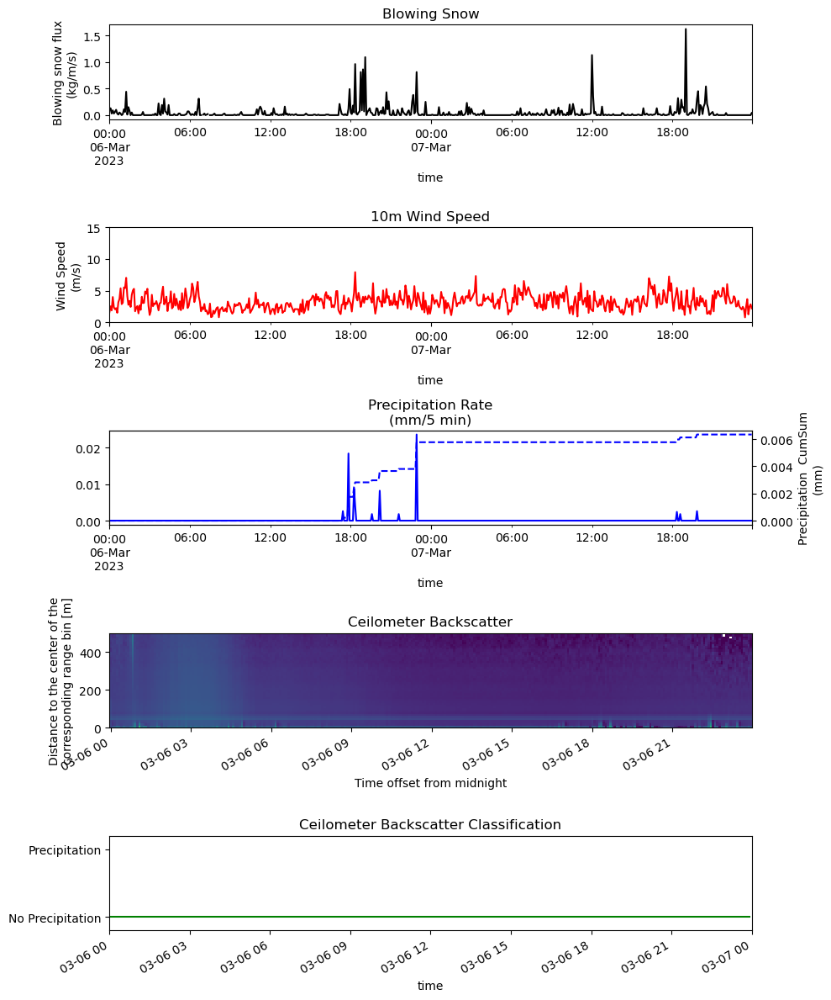

In [11]:
fig, axs = plt.subplots(nrows=5, ncols=1, figsize=(10, 12), tight_layout=True)

# plot blowing snow for these dates
df.loc[start:end]['blowing_snow'].plot(ax=axs[0], color='black')
axs[0].set_title('Blowing Snow')
axs[0].set_ylabel('Blowing snow flux\n(kg/m/s)')

# plot wind speed for these dates
df.loc[start:end]['wspd'].plot(ax=axs[1], color='red')
axs[1].set_title('10m Wind Speed')
axs[1].set_ylabel('Wind Speed\n(m/s)')
axs[1].set_ylim(0,15)

# plot precipitation rate for these dates
df.loc[start:end]['precip_rate'].plot(ax=axs[2], color='blue')
ax2 = axs[2].twinx()
(df.loc[start:end]['precip_rate'].cumsum()/12).plot(ax=ax2, color='blue', linestyle='--')
ax2.set_ylabel('Precipitation  CumSum\n(mm)')
axs[2].set_title('Precipitation Rate\n(mm/5 min)')

# plot ceilometer backscatter for these dates
im2 = np.log10(cs1_backscatter).plot.imshow(x='time', y='range',ax=axs[3], cmap='viridis', vmin=0, vmax=3, add_colorbar=False)
axs[3].set_title('Ceilometer Backscatter')

# plot mwr liquid water path for these dates
cs1_prcp_classification.plot(ax=axs[4], color='green')
axs[4].set_title('Ceilometer Backscatter Classification')
axs[4].set_xlim(pd.Timestamp(start), pd.Timestamp(end))
axs[4].set_ylabel('')
axs[4].set_ylim(-0.2, 1.2)
# add yticks to be no precipitation or precipitation at 0 and 1
axs[4].set_yticks([0,1])
axs[4].set_yticklabels(['No Precipitation', 'Precipitation'])

# Case Study 2: A day with no blowing snow but with precipitation

In [12]:
start = "20221230"
end = "20221230"
cs2_ds = get_sail_data(api_username,
                        api_token,
                        sail_datastream_dict['ceilometer'],
                        startdate=start,
                        enddate=end)

[DOWNLOADING] gucceil10mM1.b1.20221230.000005.nc


The variable(s) detection_status,status_flag,qc_first_cbh,qc_vertical_visibility,qc_second_cbh,qc_alt_highest_signal,qc_third_cbh,qc_laser_pulse_energy,qc_laser_temperature,qc_window_transmission,qc_tilt_angle,qc_background_light,qc_sum_backscatter have integer data type. Consider setting data type to float 'F64' or 'F32' using set_precision.


In [13]:
cs2_backscatter = cs2_ds.drop_dims("bound").resample(time='5min').mean()['backscatter'].isel(range=slice(1,50))
cs2_prcp_classification = precipitation_classificiation(cs2_backscatter)

invalid value encountered in log10


[Text(0, 0, 'No Precipitation'), Text(0, 1, 'Precipitation')]

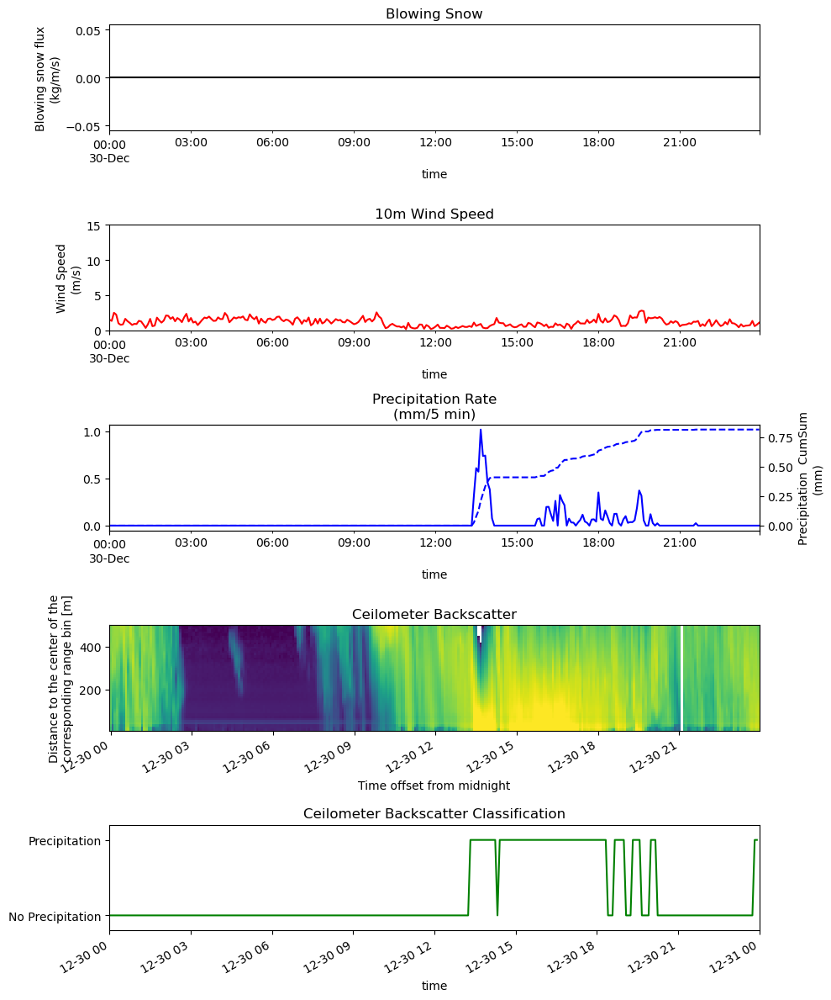

In [51]:
fig, axs = plt.subplots(nrows=5, ncols=1, figsize=(10, 12), tight_layout=True)

# plot blowing snow for these dates
df.loc[start:end]['blowing_snow'].plot(ax=axs[0], color='black')
axs[0].set_title('Blowing Snow')
axs[0].set_ylabel('Blowing snow flux\n(kg/m/s)')

# plot wind speed for these dates
df.loc[start:end]['wspd'].plot(ax=axs[1], color='red')
axs[1].set_title('10m Wind Speed')
axs[1].set_ylabel('Wind Speed\n(m/s)')
axs[1].set_ylim(0,15)

# plot precipitation rate for these dates
df.loc[start:end]['precip_rate'].plot(ax=axs[2], color='blue')
ax2 = axs[2].twinx()
(df.loc[start:end]['precip_rate'].cumsum()/12).plot(ax=ax2, color='blue', linestyle='--')
ax2.set_ylabel('Precipitation  CumSum\n(mm)')
axs[2].set_title('Precipitation Rate\n(mm/5 min)')

# plot ceilometer backscatter for these dates
im2 = np.log10(cs2_backscatter).plot.imshow(x='time', y='range',ax=axs[3], cmap='viridis', vmin=0, vmax=3, add_colorbar=False)
axs[3].set_title('Ceilometer Backscatter')

# plot mwr liquid water path for these dates
cs2_prcp_classification.plot(ax=axs[4], color='green')
axs[4].set_title('Ceilometer Backscatter Classification')
axs[4].set_xlim(pd.Timestamp(start), pd.Timestamp('20221231'))
axs[4].set_ylabel('')
axs[4].set_ylim(-0.2, 1.2)
# add yticks to be no precipitation or precipitation at 0 and 1
axs[4].set_yticks([0,1])
axs[4].set_yticklabels(['No Precipitation', 'Precipitation'])

# Case Study 3: A mixed event

In [56]:
start = "20230222"
end = "20230222"
cs3_ds = get_sail_data(api_username,
                        api_token,
                        sail_datastream_dict['ceilometer'],
                        startdate=start,
                        enddate=end)

[DOWNLOADING] gucceil10mM1.b1.20230222.000000.nc


The variable(s) detection_status,status_flag,qc_first_cbh,qc_vertical_visibility,qc_second_cbh,qc_alt_highest_signal,qc_third_cbh,qc_laser_pulse_energy,qc_laser_temperature,qc_window_transmission,qc_tilt_angle,qc_background_light,qc_sum_backscatter have integer data type. Consider setting data type to float 'F64' or 'F32' using set_precision.


In [57]:
cs3_backscatter = cs3_ds.drop_dims("bound").resample(time='5min').mean()['backscatter'].isel(range=slice(1,50))
cs3_prcp_classification = precipitation_classificiation(cs3_backscatter)

invalid value encountered in log10


[Text(0, 0, 'No Precipitation'), Text(0, 1, 'Precipitation')]

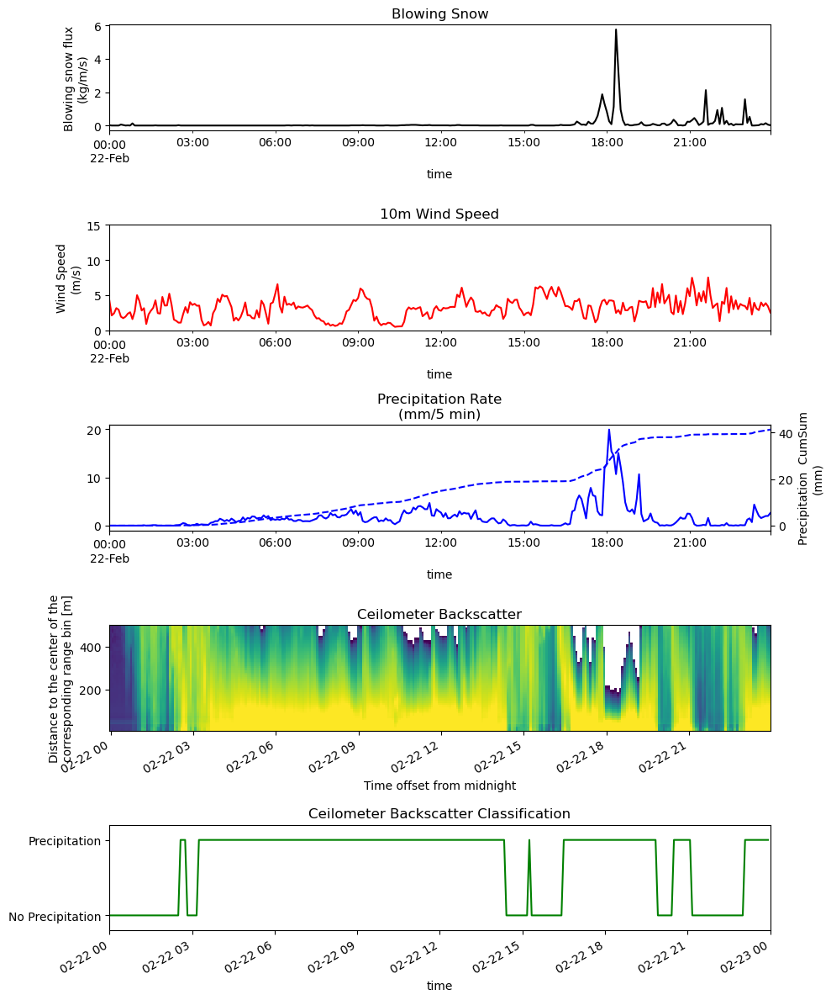

In [58]:
fig, axs = plt.subplots(nrows=5, ncols=1, figsize=(10, 12), tight_layout=True)

# plot blowing snow for these dates
df.loc[start:end]['blowing_snow'].plot(ax=axs[0], color='black')
axs[0].set_title('Blowing Snow')
axs[0].set_ylabel('Blowing snow flux\n(kg/m/s)')

# plot wind speed for these dates
df.loc[start:end]['wspd'].plot(ax=axs[1], color='red')
axs[1].set_title('10m Wind Speed')
axs[1].set_ylabel('Wind Speed\n(m/s)')
axs[1].set_ylim(0,15)

# plot precipitation rate for these dates
df.loc[start:end]['precip_rate'].plot(ax=axs[2], color='blue')
ax2 = axs[2].twinx()
(df.loc[start:end]['precip_rate'].cumsum()/12).plot(ax=ax2, color='blue', linestyle='--')
ax2.set_ylabel('Precipitation  CumSum\n(mm)')
axs[2].set_title('Precipitation Rate\n(mm/5 min)')

# plot ceilometer backscatter for these dates
im2 = np.log10(cs3_backscatter).plot.imshow(x='time', y='range',ax=axs[3], cmap='viridis', vmin=0, vmax=3, add_colorbar=False)
axs[3].set_title('Ceilometer Backscatter')

# plot mwr liquid water path for these dates
cs3_prcp_classification.plot(ax=axs[4], color='green')
axs[4].set_title('Ceilometer Backscatter Classification')
axs[4].set_xlim(pd.Timestamp(start), pd.Timestamp('20230223'))
axs[4].set_ylabel('')
axs[4].set_ylim(-0.2, 1.2)
# add yticks to be no precipitation or precipitation at 0 and 1
axs[4].set_yticks([0,1])
axs[4].set_yticklabels(['No Precipitation', 'Precipitation'])

(0.0, 400.0)

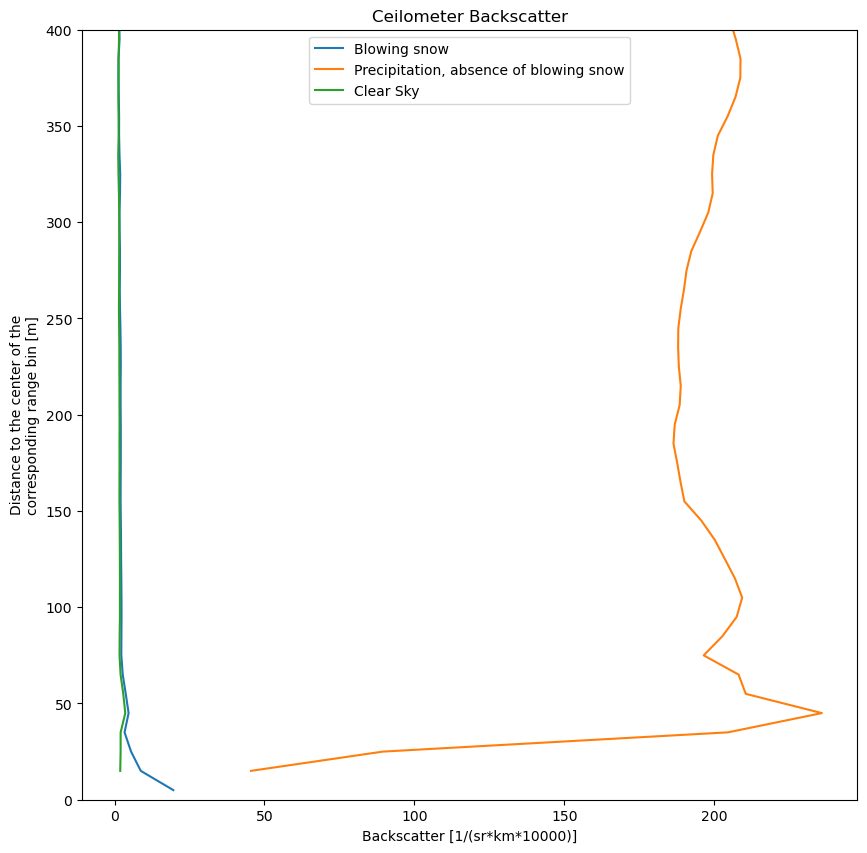

In [40]:
fig, ax = plt.subplots(figsize=(10, 10))
(((cs1_backscatter)).sel(time=f"2023-03-06T18:20:00")).plot(y='range', ax=ax, label='Blowing snow')
(((cs2_backscatter)).sel(time=f"2022-12-30T12:00:00")).plot(y='range', ax=ax, label='Precipitation, absence of blowing snow')
# (((cs3_backscatter)).sel(time=f"2023-02-22T18:00:00")).plot(y='range', ax=ax, label='Blowing snow with precipitation')
(((cs2_backscatter)).sel(time=f"2022-12-30T06:00:00")).plot(y='range', ax=ax, label='Clear Sky')
ax.legend()
ax.set_title('Ceilometer Backscatter')
ax.set_ylim(0,400)
# ax.set_xlim(-10,1000)

### Download the Ceilometer Data

In [55]:
winter_22 = ('20211201','20220401')
winter_23 = ('20221201','20230401')

In [56]:
# Set the location of the data folder where this data will be stored
winter_22_folder = 'winter_21_22'
winter_23_folder = 'winter_22_23'
 # change to location of data folder on your machine
storage_directory = f'/storage/dlhogan/synoptic_sublimation/'


### Download winter 2022 data from SAIL
For now we will just get met, ecor, and laser disdrometer data

In [134]:
# ceilometer backscatter algorithm
# for each profile, calculate the slope between 60 and 120 meters
def backscatter_slope(x, r1, r2):
    m = (x.sel(range=r2, method='nearest') - x.sel(range=r1, method='nearest')) / (r2 - r1)
    return m
# first check if the backscatter of the second range bin is greater than the threshold
def precipitation_classificiation(backscatter_ds):
    mixed_event_threshold = 700
    # values less than this threshold are filled with 0s
    precipitation_classification = xr.where(backscatter_ds.sel(range=45, method='nearest') > mixed_event_threshold, x=1, y=0)

    precipitation_classification = xr.where((backscatter_slope(backscatter_ds, 15, 145) > 10) & (precipitation_classification!=1), x=1, y=precipitation_classification)
    precipitation_classification['time'] = pd.to_datetime(precipitation_classification.time.values)
    return precipitation_classification

In [136]:
# load in the winter 22 data
sail_winter_22_folder = os.path.join(storage_directory,'sail_data',winter_22_folder)
# create empty data dictionary
w22_data_loc_dict = {}
# Iterate through the dictionary and pull the data for each datastream
for k,v in sail_datastream_dict.items():
   if (os.path.exists(f'{sail_winter_22_folder}/{k}_{winter_22[0]}_{winter_22[1]}.nc')): 
        print(f'{k}_{winter_23[0]}_{winter_23[1]}.nc already exists')
        print('-------------------')
        # add the filename to the dictionary which can be used if we want to load the data
        w22_data_loc_dict[k] = os.path.join(sail_winter_22_folder,f'{k}_{winter_22[0]}_{winter_22[1]}.nc')
        continue
   else:
      ds = get_sail_data(api_username,
                           api_token,
                           v,
                           startdate=winter_22[0],
                           enddate=winter_22[1],
                           resample='5min')
      ds.to_netcdf(f'{sail_winter_22_folder}/{k}_{winter_22[0]}_{winter_22[1]}.nc')
      w22_data_loc_dict[k] = os.path.join(sail_winter_22_folder,f'{k}_{winter_22[0]}_{winter_22[1]}.nc')

ceilometer_20221201_20230401.nc already exists
-------------------


In [140]:
ceil_w22_ds = xr.open_dataset(w22_data_loc_dict['ceilometer'])
ceil_precipitation_classification_w22 = precipitation_classificiation(ceil_w22_ds['backscatter'].isel(range=slice(0,50)))
ceil_precipitation_classification_w22.sum()/len(ceil_precipitation_classification_w22.values)

<xarray.DataArray 'backscatter' ()>
array(0.13934803)
Coordinates:
    range    float32 45.0

In [138]:
ld_precip_classificiation = xr.where(w22_prcp_rate_gts_ds.precip_rate>0, x=1, y=0)
ld_precip_classificiation.sum()/len(ld_precip_classificiation.values)

<xarray.DataArray 'precip_rate' ()>
array(0.18692608)

[Text(0, 0.5, 'No Precipitation'), Text(0, 1.5, 'Precipitation')]

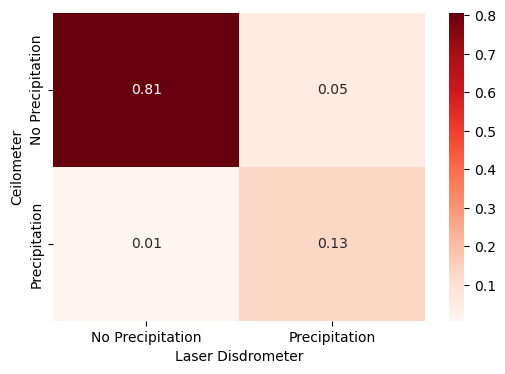

In [141]:
import seaborn as sns
# make a confusion matrix for the ceilometer and laser disdrometer precipitation classifications
confusion_matrix = pd.crosstab(ceil_precipitation_classification_w22.values, ld_precip_classificiation.values, rownames=['Ceilometer'], colnames=['Laser Disdrometer'])
# normalize between 0 and 1
confusion_matrix = confusion_matrix / confusion_matrix.sum().sum()
# plot up the confusion matrix as a heatmap
fig, ax = plt.subplots(figsize=(6,4))
sns.heatmap(confusion_matrix, annot=True, fmt='.2f', cmap='Reds', ax=ax)
# change x and y labels to have 0 be no precipitation and 1 be precipitation
ax.set_xticklabels(['No Precipitation', 'Precipitation'])
ax.set_yticklabels(['No Precipitation', 'Precipitation'])

### Download winter 2023 data from SAIL
For now we will just get met, ecor, and laser disdrometer data

In [53]:
# load in the winter 23 data
sail_winter_23_folder = os.path.join(storage_directory,'sail_data',winter_23_folder)
# create empty data dictionary
w23_data_loc_dict = {}
# Iterate through the dictionary and pull the data for each datastream
for k,v in sail_datastream_dict.items():
   if (os.path.exists(f'{sail_winter_23_folder}/{k}_{winter_23[0]}_{winter_23[1]}.nc')): 
        print(f'{k}_{winter_23[0]}_{winter_23[1]}.nc already exists')
        print('-------------------')
        # add the filename to the dictionary which can be used if we want to load the data
        w23_data_loc_dict[k] = os.path.join(sail_winter_23_folder,f'{k}_{winter_23[0]}_{winter_23[1]}.nc')
        continue
   else:
      ds = get_sail_data(api_username,
                           api_token,
                           v,
                           startdate=winter_23[0],
                           enddate=winter_23[1],
                           resample='5min')
      ds.to_netcdf(f'{sail_winter_23_folder}/{k}_{winter_23[0]}_{winter_23[1]}.nc')
      w23_data_loc_dict[k] = os.path.join(sail_winter_23_folder,f'{k}_{winter_23[0]}_{winter_23[1]}.nc')

ceilometer_20221201_20230401.nc already exists
-------------------


In [142]:
ceil_w23_ds = xr.open_dataset(w23_data_loc_dict['ceilometer'])
ceil_precipitation_classification_w23 = precipitation_classificiation(ceil_w23_ds['backscatter'].isel(range=slice(0,50)))
ceil_precipitation_classification_w23.sum()/len(ceil_precipitation_classification_w23.values)

<xarray.DataArray 'backscatter' ()>
array(0.20577938)
Coordinates:
    range    float32 45.0

In [131]:
ld_precip_classificiation = xr.where(w23_prcp_rate_gts_ds.precip_rate>0, x=1, y=0)
ld_precip_classificiation.sum()/len(ld_precip_classificiation.values)

<xarray.DataArray 'precip_rate' ()>
array(0.27619949)

[Text(0, 0.5, 'No Precipitation'), Text(0, 1.5, 'Precipitation')]

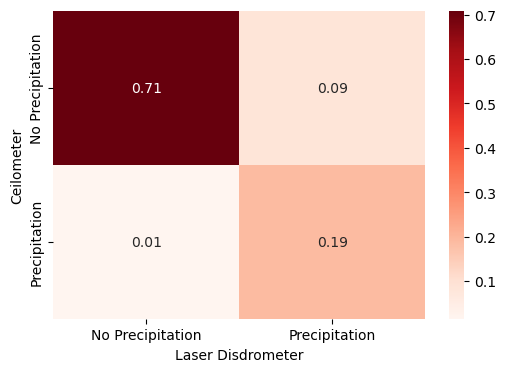

In [132]:
# make a confusion matrix for the ceilometer and laser disdrometer precipitation classifications
confusion_matrix = pd.crosstab(ceil_precipitation_classification_w23.values, ld_precip_classificiation.values, rownames=['Ceilometer'], colnames=['Laser Disdrometer'])
# normalize between 0 and 1
confusion_matrix = confusion_matrix / confusion_matrix.sum().sum()
# plot up the confusion matrix as a heatmap
fig, ax = plt.subplots(figsize=(6,4))
sns.heatmap(confusion_matrix, annot=True, fmt='.2f', cmap='Reds', ax=ax)
# change x and y labels to have 0 be no precipitation and 1 be precipitation
ax.set_xticklabels(['No Precipitation', 'Precipitation'])
ax.set_yticklabels(['No Precipitation', 'Precipitation'])

### Now, we have a general idea of when it was preciptiating vs. when it was not precipitating using the ceilometer. We are able to remove a number of periods when the laser disdrometer says it was precipitating but the ceilometer does not. We still have some error involved (around 1% of the time), but we have much higher error in the other case. 

In [143]:
# let's save each of the datasets to a netcdf file
# winter 22
ceil_precipitation_classification_w22.to_netcdf('../../01_data/processed_data/sail_processed/ceilometer_precipitation_classification_w22.nc')
# winter 23
ceil_precipitation_classification_w23.to_netcdf('../../01_data/processed_data/sail_processed/ceilometer_precipitation_classification_w23.nc')